# Predicting Airbnb Listing Prices based on Airbnb Listing Characteristics
### STAT 301 - Final Project
By: Joyce Cao, Matthew Tam, Zaim Naqvi, Genevieve Hoang

# Introduction

Short-term rental platforms such as Airbnb have transformed the hospitality industry by offering travellers a wide range of accommodation options beyond traditional hotels. As the market continues to grow, accurate pricing listings become increasingly important for both hosts seeking to optimize revenue and guests aiming to find fair value. 

Previous research has identified key Airbnb pricing determinants. Wang and Nicolau (2017) analyzed Airbnb listings across 33 cities, concluding that listing features such as room type, guest capacity, location, and amenities significantly impacted pricing through hedonic pricing models (3). Similarly, Gibbs et al. (2018) showed that host characteristics like response rate and number of reviews also meaningfully influence value and pricing (2).

Beyond structural attributes, social and psychological elements also influence listing prices, as demonstrated by Ert, Fleischer, and Magen (2016, 1). They showed that trust-related cues, like host profile photos, can impact perceived trustworthiness, booking likelihood, and pricing. Their findings reflect the broader role of host reputation in the Airbnb market.

Building on this body of literature, our project develops a predictive model to estimate Airbnb listing prices in Paris, Vienna, and Barcelona based on various listing characteristics, including room type, number of guests, location features, and host attributes. Through exploratory data analysis and statistical modelling, we aim to identify the most influential pricing variables and provide insights for both users and future sharing economy research


### Data Description

**Source:** https://www.kaggle.com/datasets/thedevastator/airbnb-prices-in-european-cities (4).

There are 6 datasets in total, containing data about Airbnb listings in Barcelona, Paris, and Vienna, on the weekdays and weekends.

The data has been combined, and the columns `city` and `day_type` were created. 

The combined dataset contains 13,058 rows of data about Airbnb listings in Barcelona, Paris, and Vienna.

The combined dataset contains 21 columns as shown below:

**Table 1: Variable Overview**


| Variable Name              | Description                                                                 | Variable Type      |
|---------------------------|-----------------------------------------------------------------------------|-----------|
| realSum                   | Total price in EUR for a 2-night stay for 2 guests                         | Continuous   |
| room_type                 | Type of room listed (Entire home/apt, Private room, Shared room)     | Categorical  |
| room_shared               | TRUE if the room is shared                                                  | Logical   |
| room_private              | TRUE if the room is private                                                 | Logical   |
| person_capacity           | Maximum number of guests allowed                                           | Numeric (Discrete)   |
| host_is_superhost         | TRUE if the host is a superhost                                             | Logical   |
| multi                     | Indicator for hosts with 2–4 listings                                       | Numeric (Binary) |
| biz                       | Indicator for hosts with >4 listings (business hosts)                       | Numeric (Binary) |
| cleanliness_rating        | Cleanliness rating (0–10 scale)                                             | Numeric (Discrete)   |
| guest_satisfaction_overall| Overall guest satisfaction rating (0–100 scale)                             | Numeric (Discrete)   |
| bedrooms                  | Number of bedrooms (0 = studio)                                             |  Numeric (Discrete)   |
| dist                      | Distance to city center in kilometers                                       | Continuous   |
| metro_dist                | Distance to nearest metro station in kilometers                             | Continuous   |
| attr_index                | Attraction index based on location                                          | Continuous   |
| attr_index_norm           | Normalized attraction index (0–100)                                         | Continuous   |
| rest_index                | Restaurant index based on location                                          | Continuous   |
| rest_index_norm           | Normalized restaurant index (0–100)                                         | Continuous   |
| lng                       | Longitude of the listing                                                    | Continuous   |
| lat                       | Latitude of the listing                                                     | Continuous   |
| city                      | City name                                                                   | Categorical |
| day_type                  | Type of day (Weekday, Weekend)                                        | Categorical |


**Question:**

Using this dataset, we would like to answer the question:
>Which set of predictors and coefficients best predict affordable Airbnb listing prices in Paris, Barcelona, and Vienna based on various characteristics of the Airbnb

>*For the purpose of this study, affordable is defined as Airbnb prices lower than the 99th percentile (1180 euros)*

We are interested in understanding how the combination of different listing characteristics and location-related factors can predict Airbnb pricing of future listings. Specifically, we will explore the physical characteristics of each Airbnb (e.g. room type, cleanliness rating, etc.) and the external factors (e.g. city, day type, etc.)

Thus, we define `realSum` as the response variable, and consider all other variables that show a significant relationship with it as explanatory variables.

--------


# Method and Results

In [3]:
# Load Packages
library(tidyverse)
library(broom)
library(leaps)
library(MASS)
library(rsample)
library(dplyr)
library(readr)
library(corrplot)
library(ggplot2)
library(car)
library(glmnet)

set.seed(999)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘MASS’


The following object is masked from ‘package:dplyr’:

    select


corrplot 0.92 loaded

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4

In [4]:
# Load Data 
#airbnb <- read_csv('airbnb.csv')

airbnb <- read_csv('airbnb.csv')
head(airbnb)

Rows: 13058 Columns: 21
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (3): room_type, city, day_type
dbl (15): realSum, person_capacity, multi, biz, cleanliness_rating, guest_sa...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,FALSE,FALSE,4,FALSE,0,1,10,91,⋯,1.111996,0.63049095,526.4694,17.94293,915.5871,20.15489,2.17556,41.39624,Barcelona,Weekday
169.8978,Private room,FALSE,TRUE,2,TRUE,1,0,10,88,⋯,1.751839,0.12401717,320.1275,10.91046,794.2774,17.48449,2.14906,41.38714,Barcelona,Weekday
161.9848,Private room,FALSE,TRUE,4,FALSE,0,1,9,88,⋯,1.670493,0.08032198,344.0739,11.72659,840.6736,18.50581,2.15357,41.37859,Barcelona,Weekday
367.9568,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,10,91,⋯,1.475847,0.09310686,400.0574,13.63460,946.5899,20.83736,2.16839,41.37390,Barcelona,Weekday
196.8953,Private room,FALSE,TRUE,3,FALSE,1,0,9,91,⋯,1.855452,0.27248605,346.0422,11.79368,792.2960,17.44087,2.15238,41.37699,Barcelona,Weekday
330.9517,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,9,100,⋯,2.565611,0.70129045,391.0874,13.32889,525.5139,11.56818,2.18197,41.40842,Barcelona,Weekday


**a.) Exploratory Data Analysis (EDA)**

In [5]:
# Main developer: Joyce 
#Check for na values in the data
sum(is.na(airbnb))

[1] 0

In [6]:
# Main developer: Joyce
quantile(airbnb$realSum, 0.99, na.rm = TRUE)

99% 
1180.185

In [7]:
# Main developer: Joyce
# Handle potential outliers in price (remove extreme values)
airbnb <- filter(airbnb, realSum > 0 & realSum < quantile(realSum, 0.99, na.rm = TRUE))
head(airbnb)

realSum,room_type,room_shared,room_private,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,⋯,dist,metro_dist,attr_index,attr_index_norm,rest_index,rest_index_norm,lng,lat,city,day_type
<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,FALSE,FALSE,4,FALSE,0,1,10,91,⋯,1.111996,0.63049095,526.4694,17.94293,915.5871,20.15489,2.17556,41.39624,Barcelona,Weekday
169.8978,Private room,FALSE,TRUE,2,TRUE,1,0,10,88,⋯,1.751839,0.12401717,320.1275,10.91046,794.2774,17.48449,2.14906,41.38714,Barcelona,Weekday
161.9848,Private room,FALSE,TRUE,4,FALSE,0,1,9,88,⋯,1.670493,0.08032198,344.0739,11.72659,840.6736,18.50581,2.15357,41.37859,Barcelona,Weekday
367.9568,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,10,91,⋯,1.475847,0.09310686,400.0574,13.63460,946.5899,20.83736,2.16839,41.37390,Barcelona,Weekday
196.8953,Private room,FALSE,TRUE,3,FALSE,1,0,9,91,⋯,1.855452,0.27248605,346.0422,11.79368,792.2960,17.44087,2.15238,41.37699,Barcelona,Weekday
330.9517,Entire home/apt,FALSE,FALSE,3,FALSE,0,1,9,100,⋯,2.565611,0.70129045,391.0874,13.32889,525.5139,11.56818,2.18197,41.40842,Barcelona,Weekday


**Table 2 showing dataset with removed outliers**

Since our research question focuses on predicting *affordable* Airbnb prices, to ensure that we better capture the characteristics and pricing patterns of listings that are more accessible to the average traveler, we removed Airbnb listings with prices above the 99th percentile of this dataset (1180 euros). These extreme values, while valid, represent luxury or atypical accommodations that are not reflective of the general market for affordable Airbnb listings. Including them would have disproportionately affected our model and skewed the results. 

In [8]:
# Main developer: Zaim

library(e1071)

airbnb %>%
  summarise(
    mean = mean(realSum),
    median = median(realSum),
    sd = sd(realSum),
    min = min(realSum),
    max = max(realSum),
    skewness = skewness(realSum),
    kurtosis = kurtosis(realSum))


Attaching package: ‘e1071’


The following object is masked from ‘package:rsample’:

    permutations




mean,median,sd,min,max,skewness,kurtosis
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
310.1689,258.2802,178.0618,63.57665,1178.581,1.692974,3.358623


**Table 3 showing statistics of price of Airbnbs**

The average price of an Airbnb listing is 310.1689 euros however the median is lower at 258.28 euros, indicating a right-skewed distribution with many high-price listings (outliers) pulling up the mean as supported by a fat-tail measure given by a kurtosis of 3.36.


**Correlation With Price:**

To explore the relationships between the continuous variables and price, we can plot a correlation heatmap. This helps us to quickly identify which numeric variables are associated with price, to what degree, and identify variables that might have less explanatory power. It also helps us spot potential multicollinearity issues.

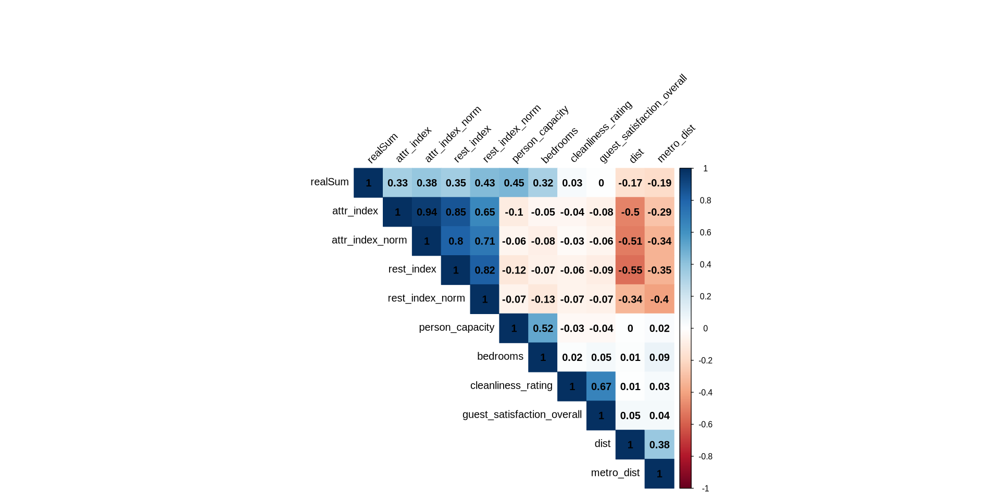

In [21]:
# Main developer: Joyce (copied from Project Planning Stage)
# Contributor: Matthew (Interpretation), Zaim (Interpretation)

selected_cols <- c("realSum", "person_capacity", "bedrooms", "cleanliness_rating", 
                   "guest_satisfaction_overall", "dist", "metro_dist", "attr_index", "rest_index",
                   "attr_index_norm", "rest_index_norm")

correlation_data <- airbnb[, selected_cols]

cor_matrix <- cor(correlation_data)

corrplot(cor_matrix, 
         method = "color",   
         type = "upper",    
         order = "hclust",          
         tl.cex = 1,           
         tl.col = "black",    
         tl.srt = 45,              
         addCoef.col = "black",    
         number.cex = 01)
options(repr.plot.width = 18, repr.plot.height = 12)



**Figure 1 showing a Correlation Heatmap between all variables in airbnb**

From the plot, we can note that `person_capacity`, `rest_index_norm`, and `attr_index_norm` show the highest absolute correlations with `realSum`, at $0.45$, $0.43$, and $0.38$ respectively. Note the strong associations between `attr_index` and `attr_index_norm`, and between `rest_index` and `rest_index_norm`. This is expected, as the latter variables are normalized versions of the former.  Finally, note that the variable `dist` shows a moderate negative association with the attraction and rest index variables.

Additionally, we can use boxplots to show visual comparison of the distributions of the response at each factor level, including the median, spread, and outliers.  This can help determine which categorical variables are likely to be significant predictors and reveal patterns of factor-level differences in price.


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine




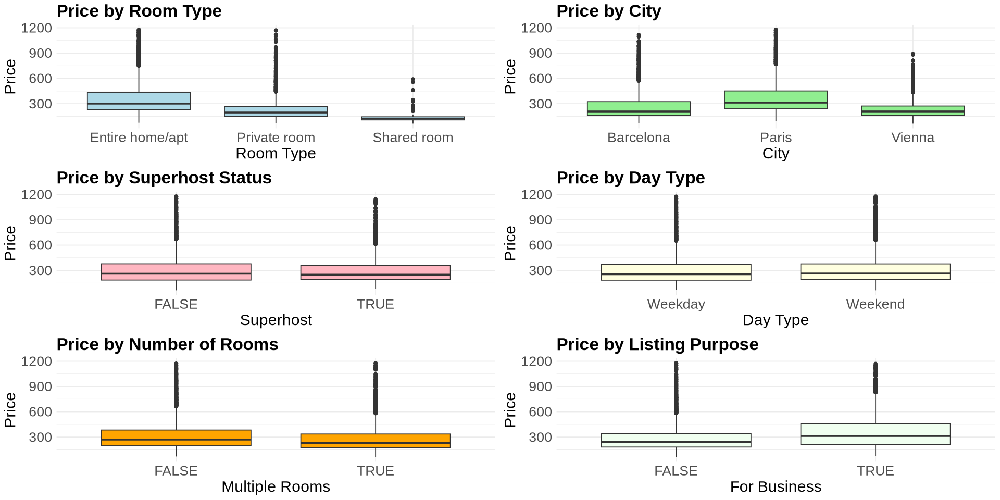

In [10]:
# Main developer: Joyce (copied from Project Planning Stage)
# Contributor: Matthew (Interpretation, Debugging), Zaim (Interpretation)

# Price vs Room Type
p1 <- ggplot(airbnb, aes(x = room_type, y = realSum)) + geom_boxplot(fill = "lightblue") + labs(title = "Price by Room Type", x = "Room Type", y = "Price") + 
 theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
    axis.text = element_text(size = 16))


# Price vs City
p2 <- ggplot(airbnb, aes(x = city, y = realSum)) + geom_boxplot(fill = "lightgreen") + labs(title = "Price by City", x = "City", y = "Price") +
theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
    axis.text = element_text(size = 16))

# Price vs Superhost
p3 <- ggplot(airbnb, aes(x = factor(host_is_superhost), y = realSum)) + geom_boxplot(fill = "lightpink") + labs(title = "Price by Superhost Status", x = "Superhost", y = "Price") +
theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
    axis.text = element_text(size = 16))

# Price vs Day Type
p4 <- ggplot(airbnb, aes(x = day_type, y = realSum)) +geom_boxplot(fill = "lightyellow") + labs(title = "Price by Day Type", x = "Day Type", y = "Price")+
theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
axis.text = element_text(size = 16))

# Price vs Number of Rooms
p5 <- ggplot(airbnb, aes(x = factor(multi), y = realSum)) +geom_boxplot(fill = "orange") +
labs(title = "Price by Number of Rooms", x = "Multiple Rooms", y = "Price") + scale_x_discrete(labels = c("0" = "FALSE", "1" = "TRUE")) +
theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
axis.text = element_text(size = 16))

# Price vs Purpose 
p6 <- ggplot(airbnb, aes(x = factor(biz), y = realSum)) + geom_boxplot(fill = "honeydew") +    labs(title = "Price by Listing Purpose", x = "For Business", y = "Price") +
    scale_x_discrete(labels = c("0" = "FALSE", "1" = "TRUE")) + theme(axis.text.x = element_text(angle = 30, hjust = 1)) + theme_minimal() + 
theme( plot.title = element_text(size = 20, face = "bold"), axis.title = element_text(size = 18),
    axis.text = element_text(size = 16))


library(gridExtra)
options(repr.plot.width = 16, repr.plot.height = 8)
grid.arrange(p1, p2, p3, p4, p5, p6, ncol = 2)


**Figure 2 showing boxplots of price distributions for different levels of categorical variables present in airbnb**

From these boxplots, we observe that for `room_type`, entire home/apartment listings have the highest median price, followed by private, then shared rooms.  For `city`, we can see that Paris has the highest median price, followed by Vienna, then Barcelona. Furthermore, business listings (`biz`) tend to have higher prices, and listings for multiple rooms (`multi`) tend to have slightly lower prices.  These patterns suggest that these variables could potentially be significant predictors of price.

The remaining variables do not show notable patterns, suggesting that they may not have a significant impact on price.  We should also consider that their effects could be confounded by other variables.

We removed the following variables from our dataset based on domain knowledge and statistical justification:
- `room_shared` and `room_private`: Information is already captured by the room_type variable, which is more comprehensive.
- `attr_index` and `rest_index`: Redundant, contribute to multicollinearity with their normalized versions (attr_index_norm, rest_index_norm), which we retained.
- `lng` and `lat`: Location information is already summarized by the city variable.

In [11]:
# Main developer: Matthew
# Select Relevant Variables
airbnb_clean <- airbnb %>%
    dplyr::select( -room_shared, -room_private, -attr_index, -rest_index, -lng, -lat)
head(airbnb_clean)

realSum,room_type,person_capacity,host_is_superhost,multi,biz,cleanliness_rating,guest_satisfaction_overall,bedrooms,dist,metro_dist,attr_index_norm,rest_index_norm,city,day_type
<dbl>,<chr>,<dbl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
474.3175,Entire home/apt,4,FALSE,0,1,10,91,1,1.111996,0.63049095,17.94293,20.15489,Barcelona,Weekday
169.8978,Private room,2,TRUE,1,0,10,88,1,1.751839,0.12401717,10.91046,17.48449,Barcelona,Weekday
161.9848,Private room,4,FALSE,0,1,9,88,1,1.670493,0.08032198,11.72659,18.50581,Barcelona,Weekday
367.9568,Entire home/apt,3,FALSE,0,1,10,91,1,1.475847,0.09310686,13.63460,20.83736,Barcelona,Weekday
196.8953,Private room,3,FALSE,1,0,9,91,1,1.855452,0.27248605,11.79368,17.44087,Barcelona,Weekday
330.9517,Entire home/apt,3,FALSE,0,1,9,100,2,2.565611,0.70129045,13.32889,11.56818,Barcelona,Weekday


**Table 4 showing final dataset used in analysis plan**

**b.) Analysis Plan**

To answer our question, we will use an additive multiple linear regression model. This approach is appropriate because our response variable, price, is continuous and shows a moderate positive correlation with bedrooms, person_capacity etc. and a weak negative correlation with dist, metro_dist, etc., giving some credence to the linearity assumption.

1. **Data Splitting**: We will begin by splitting the dataset into a training set (75%) and a testing set (25%) using `initial_split()` from the rsample package. All variable selection and model fitting will be conducted exclusively on the training set to avoid data leakage and double dipping and ensure an unbiased estimate of the model's performance.

2. **Variable Selection**:  To identify the most relevant predictors of Airbnb listing prices, we will apply LASSO regression via `cv.glmnet` which applies an L1-norm penalty to shrink less important coefficients to zero. This approach is more robust than traditional stepwise selection and helps prevent overfitting. Optimal λ will be chosen using 10-fold cross-validation on training data, selecting the λ with lowest average MSE to ensure good generalization. Note since this model is based on prediction and we are less concerned about interpretation, it's unnecessary to decrease coefficients to zero by increasing λ for less complexity.

3. **Model Evaluation**: Once the final model is selected, we will evaluate its predictive performance using the testing set. In particular, we will use the RMSE (average prediction error magnitude) and R-squared (proportion of variance explained) to evaluate predictive performance. We will use the `predict()` function to generate predictions on the test data.


4. **Model Diagnostic Checks**: Before finalizing the model, we will perform a series of diagnostic checks to ensure key assumptions of linear regression are not violated, including:

   - Assessing linearity and homoscedasticity using residual plots

   - Evaluate normality of residuals using QQ-plots

   - Check multicollinearity among predictors using `vif()`

**c.) Results**

**Data Splitting**

In [12]:
# Main developer: Matthew
# Train/Test Split
split_data <- initial_split(airbnb_clean, prop = 0.75)

train <- training(split_data)
test <- testing(split_data)

**Variable Selection**

In [13]:
# Main developer: Joyce

# Lasso Regression
lasso_model <- cv.glmnet(model.matrix(realSum ~ . - 1, data = train),
                         y = train$realSum,
                         alpha = 1
    
)
lasso_model


Call:  cv.glmnet(x = model.matrix(realSum ~ . - 1, data = train), y = train$realSum,      alpha = 1) 

Measure: Mean-Squared Error 

    Lambda Index Measure    SE Nonzero
min  0.209    65   15303 438.0      16
1se  5.962    29   15696 474.3      11

**Table 5 showing possible lambda coefficients**

In [14]:
# Main developer: Joyce

# Chosen Lasso Coefficients
beta_lasso <- coef(lasso_model, s = "lambda.min")


lasso_selected_covariates <- as_tibble(
        as.matrix(beta_lasso),
        rownames='covariate') %>%
        filter(covariate != '(Intercept)' & abs(s1) !=0) %>% 
        pull(covariate)

cat(paste0("- ", lasso_selected_covariates), sep = "\n")

- room_typeEntire home/apt
- room_typeShared room
- person_capacity
- host_is_superhostTRUE
- multi
- biz
- cleanliness_rating
- guest_satisfaction_overall
- bedrooms
- dist
- metro_dist
- attr_index_norm
- rest_index_norm
- cityParis
- cityVienna
- day_typeWeekend


**Table 6 showing Lasso Selected Covariates**

In [15]:
# Main developer: Joyce

# To keep the reference levels of dummy variables consistent through lasso and lm
train$room_type <- relevel(factor(train$room_type), ref = "Private room")

# Selected linear model
airbnb_mlr_predictor <- lm(realSum ~ ., data = train)

tidy(airbnb_mlr_predictor)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-223.3467499,16.4268881,-13.5964127,1.015078e-41
room_typeEntire home/apt,79.9161031,3.4695311,23.0336895,2.452909e-114
room_typeShared room,-152.2948173,13.3903368,-11.3734867,8.756841e-30
person_capacity,41.8367785,1.4047762,29.7818109,1.470004e-186
host_is_superhostTRUE,12.1717250,3.3776281,3.6036309,3.153778e-04
multi,19.9455658,3.2092606,6.2150034,5.343992e-10
biz,62.0525202,3.2371119,19.1690997,2.051274e-80
cleanliness_rating,10.8457334,1.7869872,6.0692844,1.333031e-09
guest_satisfaction_overall,0.5868656,0.2068340,2.8373745,4.558079e-03


**Table 7 showing Lasso Coefficients and Covariates on Training Data**

### Predicted Model Overview 
The final set of covariates was determined through LASSO regression using cross-validation to obtain the λ with the lowest MSE on training data, which created a penalty on the sum of absolute values of the coefficients that retained all 16 covariates (refer to Table 6). These variables were chosen because they provided the strongest predictive contribution to price while reducing less relevant predictors to improve generalizability and out-of-sample prediction performance on new data.

Due to the nature of additive MLR models, **each predictor coefficient below is interpreted to represent changes in expected listing price (in euros), holding all other variables constant.** Regarding room type, listings categorized as 'Entire home/apartment' were associated with significantly higher prices (β ≈ 80), while 'Shared' rooms were associated with drastically lowered prices (β ≈ -152), compared to the baseline (Private room). This aligns with intuitive pricing hierarchies in hospitality. Business hosts (those with more than 4 listings) were associated with much higher prices (β ≈ 62) than single-listing hosts, while hosts with 2–4 listings were associated with only slightly higher prices relative to single-listings (β ≈ 20). Similarly, every additional bedroom is associated with an average increase of approximately €64.68 in predicted price, and every additional person allowed is associated with an average increase of €41.84 in predicted price, reinforcing the expectation that larger listings are more expensive.

Unsurprisingly, several location-related variables also played a role. Vienna listings were significantly cheaper than those in Barcelona (reference), with a coefficient of approximately β ≈ -66, while Paris listings had a small, non-significant increase in price (β ≈ 1.5) relative to Barcelona. The normalized attraction index (β ≈ 3.6) and restaurant index (β ≈ 2.1) were positively associated with price, as expected, suggesting that proximity to amenities influences demand and pricing. Weekend listings averaged €16.74 higher than weekday listings, aligning with the expected bump in leisure-driven demand.

Several additional predictors also showed expected associations: higher cleanliness ratings (β ≈ 10.8) and guest satisfaction overall scores (β ≈ 0.58) linked to modest price increases, reflecting consumer preferences for well-reviewed, high-quality listings. Each 1 km increase in metro distance decreased average price by €1.17, consistent with the importance of location and accessibility. Superhost status was associated with only slightly higher prices (β ≈ 12), which was unexpected given the high maintenance standards required by Superhosts.

Most unexpectedly, the model predicts a unit increase in distance from the city centre is associated with a 3.31 increase in expected price. This contradicts not only EDA findings showing negative correlation (-0.17) between distance and price, but also intuition suggesting distance should decrease price. However, this likely occurs as there are two distance variables, and the model cannot separate the effect of one from the other. While this affects model interpretability, the purpose of this project focuses on prediction of price, which is not negatively affected. 



**Model Evaluation**

In [16]:
# Main Developer: Joyce

evaluate_model <- function(observed, predicted) {
  residuals <- observed - predicted
  
  metrics <- list(
    RMSE = sqrt(mean(residuals^2)),
      MSE = mean(residuals^2),
    MAE = mean(abs(residuals)),
    R_squared = 1 - sum(residuals^2) / sum((observed - mean(observed))^2)
  )
  
  return(metrics)
}

# Compute RMSE
test_predictions <- predict(airbnb_mlr_predictor, newdata = test)

model_performance <- evaluate_model(test$realSum, test_predictions)

model_performance

$RMSE
[1] 119.5124

$MSE
[1] 14283.2

$MAE
[1] 85.77273

$R_squared
[1] 0.5419883

The model achieved a test RMSE of approximately 119.51, a test MAE of 85.77, and a test R-squared of 0.542. The RMSE indicates predictions differ from actual prices by approximately €119 on average, with larger errors penalized more heavily due to residual squaring. The MAE provides a straightforward measure showing average prediction errors of about €86. The R-squared value indicates 54.2% of price variation in the test set is explained by our model, demonstrating moderate predictive accuracy with room for improvement.


**Model Diagnostic Check**

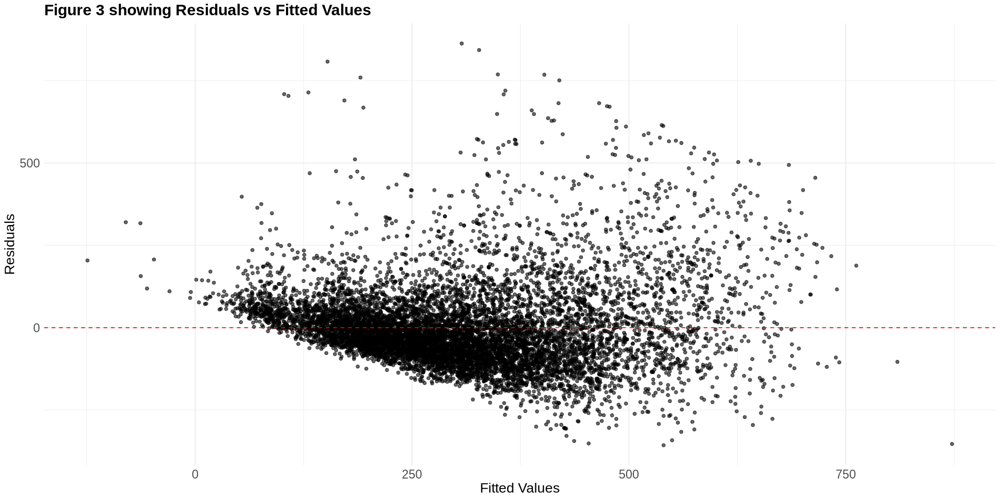

In [17]:
# Main Developer: Joyce
# Contributor: Zaim (Interpretation)
# Residuals vs Fitted Values
diagnostics <- augment(airbnb_mlr_predictor)

ggplot(diagnostics, aes(.fitted, .resid)) +
  geom_point(alpha = 0.6) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(title = "Figure 3 showing Residuals vs Fitted Values",
       x = "Fitted Values",
       y = "Residuals") +
  theme_minimal() +   theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14)
  )

The residuals vs fitted values plot shows residuals generally centered around zero, but with a clear funnel-shaped pattern indicating increasing spread with fitted values. This indicates a violation of the constant variance (homoscedasticity) assumption, making the model more variable and less accurate for higher-priced listings. This could potentially be addressed in future work through response variable transformation (e.g. log transformation).

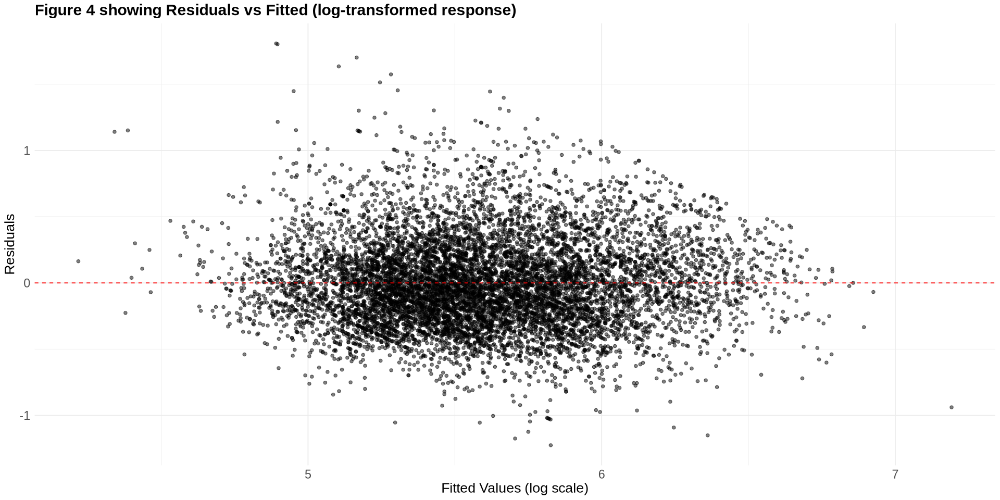

In [18]:
# Main developer: Joyce
# Contributor: Zaim (Interpretation)

airbnb_log_model <- lm(
  log(realSum) ~ room_type + person_capacity + cleanliness_rating + bedrooms + dist +metro_dist + attr_index_norm + rest_index_norm +    city + day_type, data = train)

diagnostics_log <- augment(airbnb_log_model)

# Plot Residuals vs Fitted
library(ggplot2)
ggplot(diagnostics_log, aes(.fitted, .resid)) +
  geom_point(alpha = 0.5) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(title = "Figure 4 showing Residuals vs Fitted (log-transformed response)",
       x = "Fitted Values (log scale)",
       y = "Residuals") +
  theme_minimal() +   theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14))

Log transformation of the response variable improved model assumptions and addressed heteroscedasticity. However, transforming the response changes model interpretation and can introduce bias when exponentiating the predictions to the original scale. To maintain interpretability and direct prediction of price, we continued with the original model. Future studies focusing on improving model validity could address this violation through transformations or alternative modeling techniques.


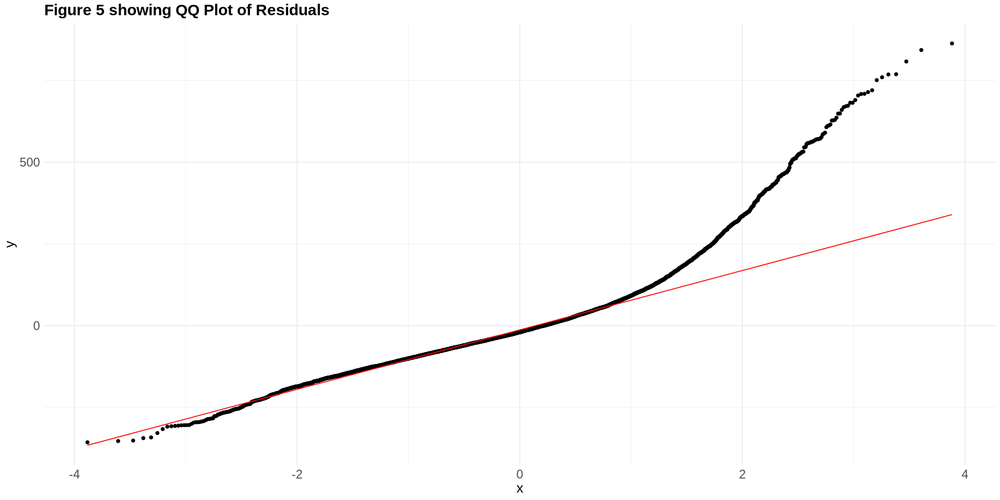

In [19]:
# Main Developer: Joyce
# Contributor: Zaim (Interpretation)
# QQ plot

ggplot(diagnostics, aes(sample = .resid)) +
  stat_qq() +
  stat_qq_line(color = "red") +
  labs(title = "Figure 5 showing QQ Plot of Residuals") +
  theme_minimal()  +   theme(
    plot.title = element_text(size = 18, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14)
  )

Some right skewness appears in residuals, consistent with earlier findings (table 3), however, given the large sample size, we proceeded with the current model while acknowledging that prediction intervals may be less accurate due to the heavy tails. The point estimates and overall model performance should remain reliable.


In [20]:
# Main Developer: Joyce
vif(airbnb_mlr_predictor)

,GVIF,Df,GVIF^(1/(2*Df))
room_type,1.763759,2,1.152417
person_capacity,1.912414,1,1.382901
host_is_superhost,1.104457,1,1.050931
multi,1.288862,1,1.135280
biz,1.376573,1,1.173275
cleanliness_rating,1.851427,1,1.360672
guest_satisfaction_overall,1.933239,1,1.390410
bedrooms,1.532202,1,1.237821
dist,2.218126,1,1.489338
metro_dist,1.522551,1,1.233917


**Table 8 showing Vif scores to diagnose multicollinearity**

Most predictors had low VIF values (below 5), indicating minimal multicollinearity. Two predictors — rest_index_norm and city — had moderately high VIFs (both around 8), suggesting some multicollinearity. However, since the analysis goal is prediction rather than inference, and predictive performance wasn't negatively affected, all variables were retained.



---

# Discussion

In our analysis, the chosen model was able to explain approximately 54% of the variability in Airbnb prices below the 99th percentile across Paris, Barcelona, and Vienna meaning roughly a little over half of the variation in listing prices can be attributed to the predictors we selected, while the remainder is driven by factors not explored  in the dataset, such as unmeasured host strategies or seasonal fluctuations. The model’s average error in predicting a price was about €86 as shown by MAE, and larger mistakes (outliers) — which are penalized more heavily — averaged around €119 as shown by RMSE. This level of accuracy indicates that while the model captures some meaningful pricing patterns, its predictive strength is moderate and has room for improvement.

One encouraging outcome was that none of the 16 covariates were removed by LASSO, indicating that each contributed some predictive value to the model, consistent with the complex nature of Airbnb pricing. The results fell slightly short of our expectations, suggesting that the relationship between listing characteristics, location-based variables, and price is more complex than our predictors and linear framework (with LASSO variable selection) could fully capture. In particular, the moderate performance may reflect nonlinear effects, interactions, or omitted variables such as unmeasured host strategies, seasonal fluctuations, or unique property attributes. Nonetheless, the model provides a solid starting point for understanding price drivers in these markets.

While our model had acceptable error rates, the residual diagnostic plots revealed heteroscedasticity and non-normal residuals, likely due to the right-skewed distribution of price. A potential improvement could involve applying a log transformation to the response variable (realSum), which may stabilize variance and yield more normally distributed residuals by shrinking higher prices. Another potential area for improvement could be the inclusion of interaction terms. It is entirely plausible that interactions exist between variables — for instance, pairings like room type and city — which may affect price jointly rather than independently. Exploring two-way interaction terms in future models could help enhance predictive performance while limiting complexity with higher order interaction terms. Although some multicollinearity was detected (notably between rest_index_norm and city, both with VIFs around 8), it did not noticeably degrade predictive performance.

Additionally, some omitted variables, as alluded to earlier, may explain the remaining unexplained variance. For instance, seasonality and special holidays could capture further price variation (irreducible error in the current model), both of which typically influence price. Future research could incorporate temporal variables and time series analysis to improve predictions.


 
**Future questions**
1. How do seasonal trends and special holidays affect Airbnb listing prices across different cities?


2. Can city-specific models outperform a pooled model when predicting Airbnb prices in diverse markets like Barcelona, Paris, and Vienna?


3. Does including interaction terms between variables like room type and city significantly improve the predictive performance of the model?



---

# References

1. Ert, E., Fleischer, A., & Magen, N. (2016). Trust and reputation in the sharing economy: The role of personal photos in Airbnb. Tourism Management, 55, 62–73. https://doi.org/10.1016/j.tourman.2016.01.013

2. Gibbs, C., Guttentag, D., Gretzel, U., Morton, J., & Goodwill, A. (2018). Pricing in the sharing economy: A hedonic pricing model applied to Airbnb listings. Journal of Travel & Tourism Marketing, 35(1), 46–56. https://doi.org/10.1080/10548408.2017.1308292

3. Wang, D., & Nicolau, J. L. (2017). Price determinants of sharing economy-based accommodation rental: A study of listings from 33 cities on Airbnb.com. International Journal of Hospitality Management, 62, 120–131. https://doi.org/10.1016/j.ijhm.2016.12.007

4. Gyódi, K., & Nawaro, Ł. (2021, March 25). Determinants of Airbnb prices in European cities: A spatial econometrics approach (supplementary material). Zenodo. https://doi.org/10.5281/zenodo.4446043
